In [2]:
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os
from helperFxns import lett2num,alg2bin,filterAln,simMat

In [16]:
def read_fasta(filename):
    with open(filename, 'r') as f:
        lines = f.readlines()
    seqs = []
    for line in lines:
        if line[0] != '>':
            seqs.append(line.strip())
    return seqs

def one_hot_tranform(seqs,lett2index=None,N_aa=21):
    #convert to numbers
    _num = lett2num(seqs,lett2index=lett2index)
    # convert to one-hot 
    ## dimension M * (N_aa * L)
    seqs_one_hot = alg2bin(_num,N_aa=N_aa).toarray()
    return seqs_one_hot

def calc_cov_mat(seqs_one_hot,N_aa=21):
    # transpose the matrix
    seqs_one_hot_3d = seqs_one_hot.reshape(seqs_one_hot.shape[0],-1,N_aa).transpose(0,2,1)
    # centered the matrix
    seqs_one_hot_3d_centered = seqs_one_hot_3d - np.mean(seqs_one_hot_3d,axis = 0)
    # calculate the covariance matrix
    cov_mat = np.tensordot(seqs_one_hot_3d_centered.T,seqs_one_hot_3d_centered,axes=([2],[0]))/seqs_one_hot_3d_centered.shape[0]
    
    return cov_mat


In [78]:
A_filtered_seqs  = read_fasta('A_filtered.fasta')
A_filtered_one_hot = one_hot_tranform(A_filtered_seqs)
A_cov = calc_cov_mat(A_filtered_one_hot)

{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}


In [23]:
A_filtered_one_hot_3d = A_filtered_one_hot.reshape(A_filtered_one_hot.shape[0],-1,21).transpose(0, 2, 1)
A_filtered_one_hot_3d.shape

(3104, 21, 161)

In [24]:
A_cov = np.tensordot(A_filtered_one_hot_3d.T, A_filtered_one_hot_3d, axes=([2],[0]))/A_filtered_one_hot_3d.shape[0]
A_cov.shape

(161, 21, 21, 161)

<Axes: >

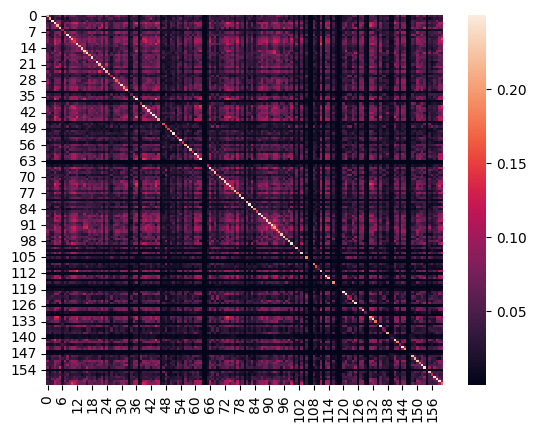

In [79]:
## collapse method
# max
A_cov_max = A_cov.max(axis=(1,2))
sns.heatmap(A_cov_max)

<Axes: >

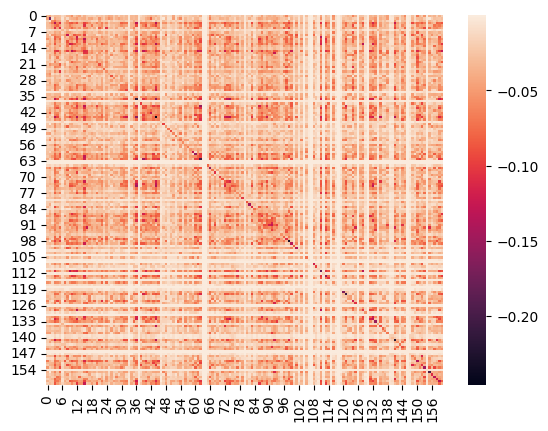

In [80]:
# min
A_cov_min = A_cov.min(axis=(1,2))
sns.heatmap(A_cov_min)

<Axes: >

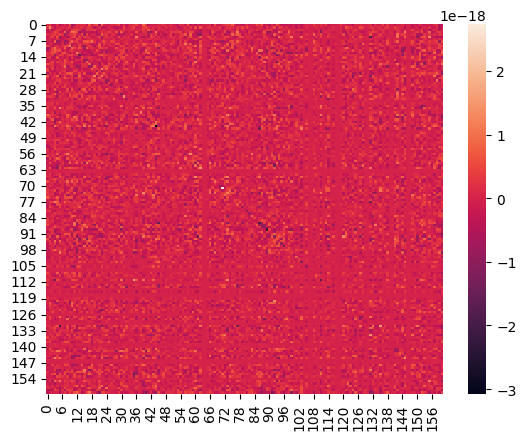

In [81]:
# mean
A_cov_mean = A_cov.mean(axis=(1,2))
sns.heatmap(A_cov_mean)

<Axes: >

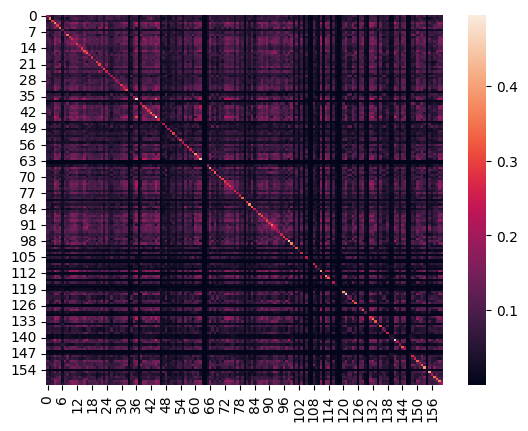

In [82]:
# L2 norm
A_cov_L2 = np.linalg.norm(A_cov,ord=2, axis=(1,2))
sns.heatmap(A_cov_L2)

<Axes: >

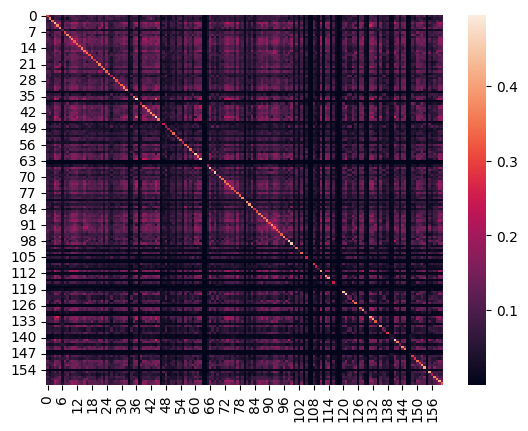

In [83]:
# Frobenius norm
A_cov_Fro = np.linalg.norm(A_cov, ord='fro', axis=(1,2))
sns.heatmap(A_cov_Fro)

<Axes: >

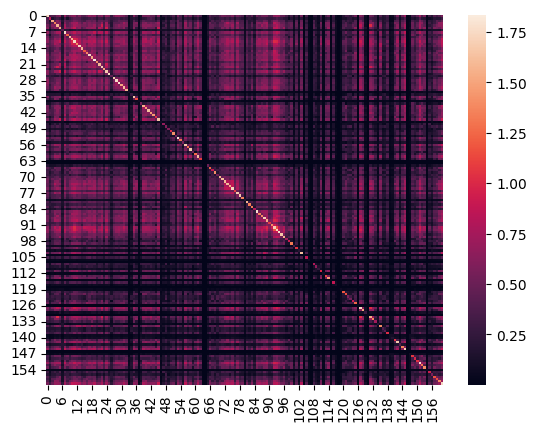

In [84]:
# L1 norm
A_cov_L1 = np.sum(np.abs(A_cov), axis=(1,2))
sns.heatmap(A_cov_L1)

{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}
{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}
{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}
{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}


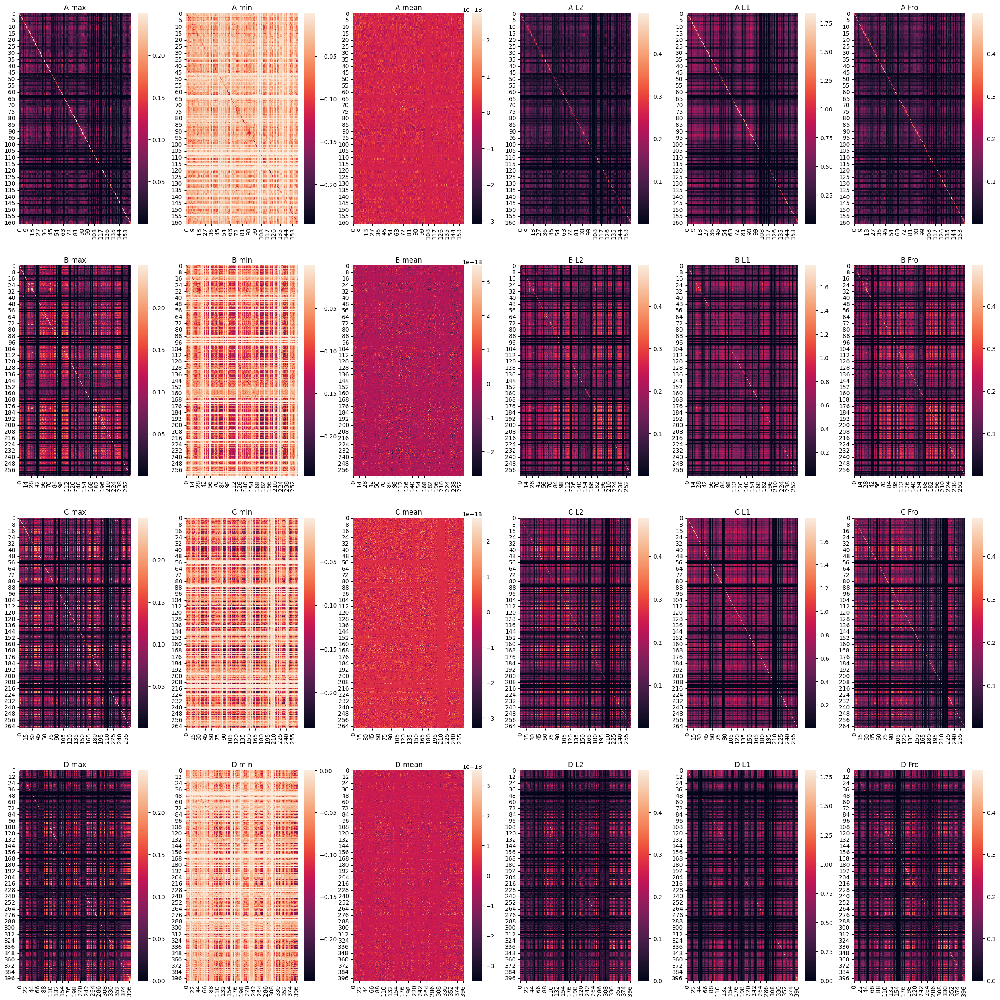

In [85]:
data_sets = ['A_filtered.fasta', 'B_filtered.fasta', 'C_filtered.fasta', 'D_filtered.fasta']
data_sets_name = ['A', 'B', 'C', 'D']
methods = ['max', 'min', 'mean', 'L2', 'L1','Fro']
fig,axes = plt.subplots(4,6, figsize=(30,30))

for (i,data_set), name in zip(enumerate(data_sets), data_sets_name):
    seqs  = read_fasta(data_set)
    one_hot = one_hot_tranform(seqs)
    cov = calc_cov_mat(one_hot)
    
    for method, ax in zip(methods, axes[i].flatten()):
        if method == 'max':
            cov_max = cov.max(axis=(1,2))
            sns.heatmap(cov_max, ax=ax)
        elif method == 'min':
            cov_min = cov.min(axis=(1,2))
            sns.heatmap(cov_min, ax=ax)
        elif method == 'mean':
            cov_mean = cov.mean(axis=(1,2))
            sns.heatmap(cov_mean, ax=ax)
        elif method == 'L2':
            cov_L2 = np.linalg.norm(cov,ord=2, axis=(1,2))
            sns.heatmap(cov_L2, ax=ax)
        elif method == 'L1':
            cov_L1 = np.sum(np.abs(cov), axis=(1,2))
            sns.heatmap(cov_L1, ax=ax)
        elif method == 'Fro':
            cov_Fro = np.linalg.norm(cov, ord='fro', axis=(1,2))
            sns.heatmap(cov_Fro, ax=ax)
        ax.set_title(f'{name} {method}')

{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}
{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}
{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}
{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}


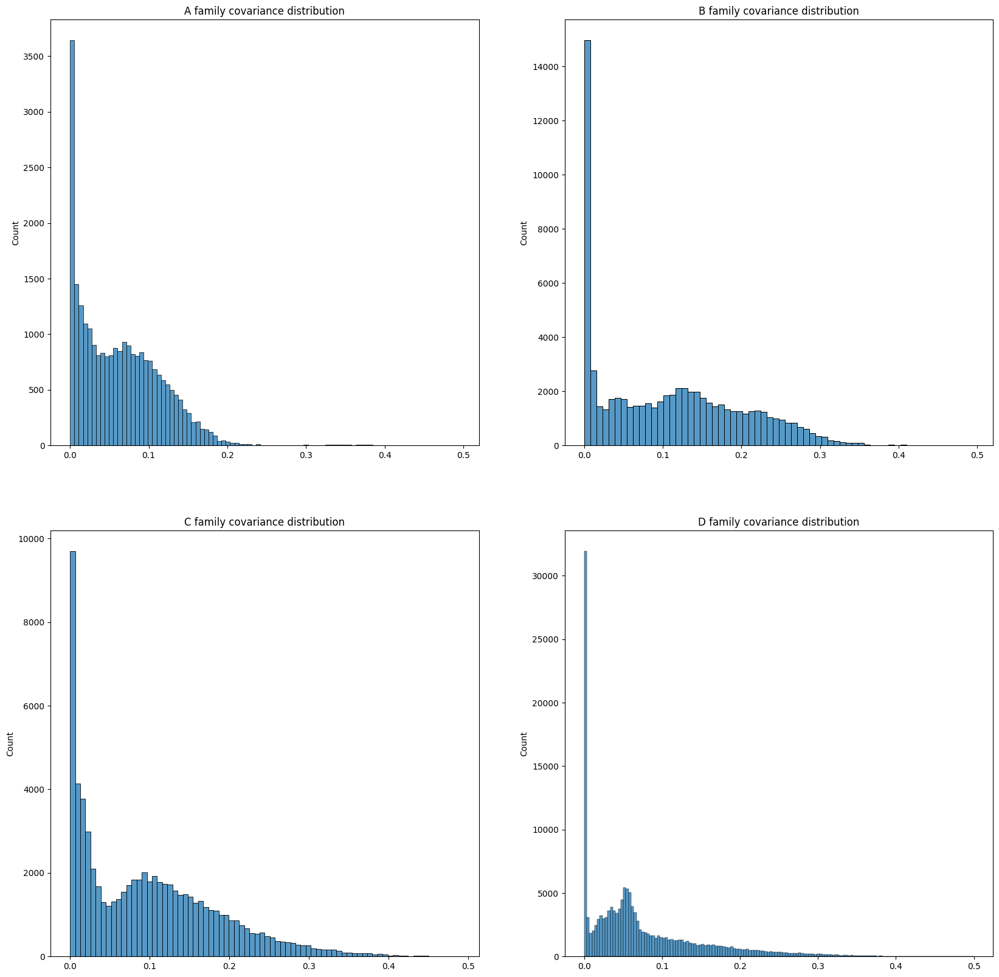

In [163]:
## plot the histogram for Fro norm method
fig,axes = plt.subplots(2,2, figsize=(20,20))
for (i,data_set), name, ax in zip(enumerate(data_sets), data_sets_name,axes.flatten()):
    seqs  = read_fasta(data_set)
    one_hot = one_hot_tranform(seqs)
    cov = calc_cov_mat(one_hot)
    cov_Fro = np.linalg.norm(cov, ord='fro', axis=(1,2))
    sns.histplot(cov_Fro.flatten(), ax=ax)
    ax.set_title(f'{name} family covariance distribution')
    

In [86]:
## convert the specified amino type to physiochemical properties
## https://en.wikipedia.org/wiki/Amino_acid
## Polar: 1, Non-Polar: 2, Positively Charged: 3, Negatively Charged: 4, Blanks('-'): 5
lett2index = {'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1,
                'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2,
                'K': 3, 'R': 3, 'H': 3,
                'D': 4, 'E': 4,
                '-': 5}

In [87]:
A_filtered_seqs  = read_fasta('A_filtered.fasta')
A_filtered_one_hot = one_hot_tranform(A_filtered_seqs,lett2index=lett2index,N_aa=5)

{'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1, 'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2, 'K': 3, 'R': 3, 'H': 3, 'D': 4, 'E': 4, '-': 5}


{'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1, 'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2, 'K': 3, 'R': 3, 'H': 3, 'D': 4, 'E': 4, '-': 5}
{'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1, 'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2, 'K': 3, 'R': 3, 'H': 3, 'D': 4, 'E': 4, '-': 5}
{'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1, 'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2, 'K': 3, 'R': 3, 'H': 3, 'D': 4, 'E': 4, '-': 5}
{'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1, 'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2, 'K': 3, 'R': 3, 'H': 3, 'D': 4, 'E': 4, '-': 5}


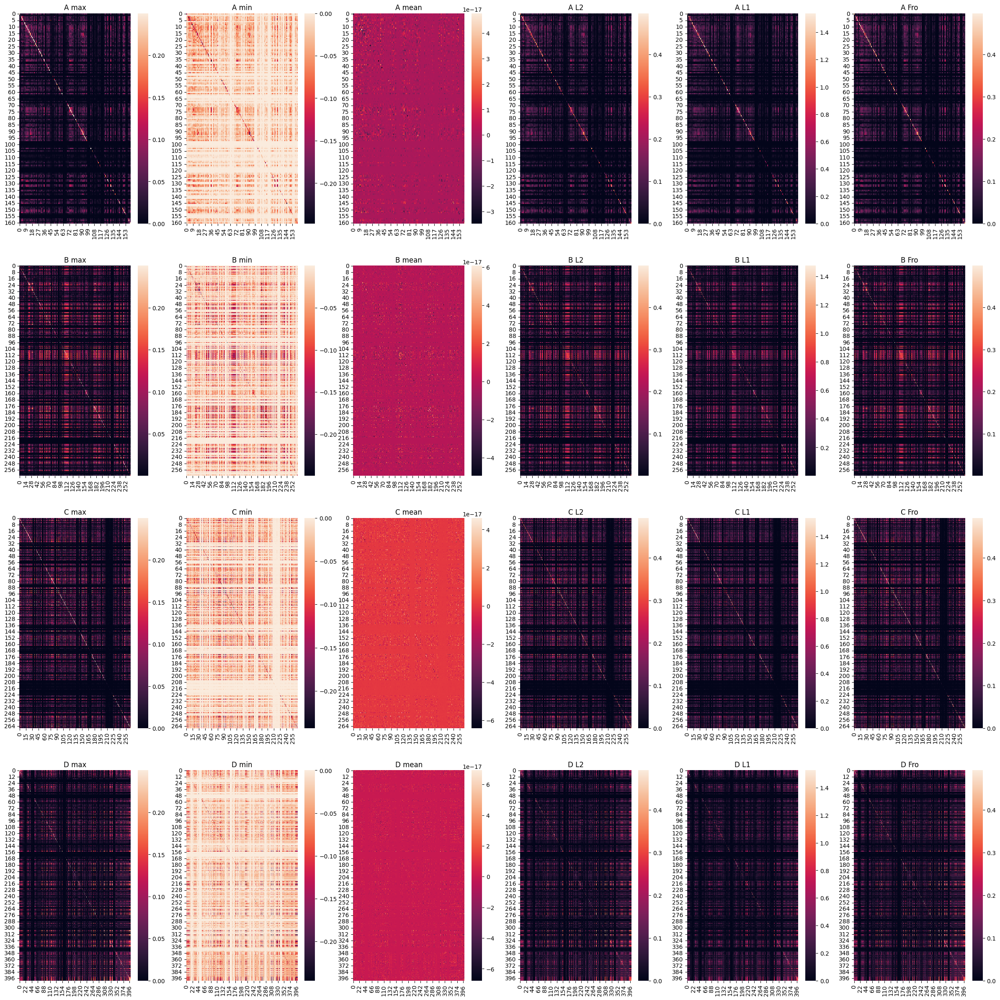

In [88]:
data_sets = ['A_filtered.fasta', 'B_filtered.fasta', 'C_filtered.fasta', 'D_filtered.fasta']
data_sets_name = ['A', 'B', 'C', 'D']
methods = ['max', 'min', 'mean', 'L2', 'L1',"Fro"]
fig,axes = plt.subplots(4,6, figsize=(30,30))

for (i,data_set), name in zip(enumerate(data_sets), data_sets_name):
    seqs  = read_fasta(data_set)
    one_hot = one_hot_tranform(seqs,lett2index=lett2index,N_aa=5)
    cov = calc_cov_mat(one_hot,N_aa=5)
    
    for method, ax in zip(methods, axes[i].flatten()):
        if method == 'max':
            cov_max = cov.max(axis=(1,2))
            sns.heatmap(cov_max, ax=ax)
        elif method == 'min':
            cov_min = cov.min(axis=(1,2))
            sns.heatmap(cov_min, ax=ax)
        elif method == 'mean':
            cov_mean = cov.mean(axis=(1,2))
            sns.heatmap(cov_mean, ax=ax)
        elif method == 'L2':
            cov_L2 = np.linalg.norm(cov, ord=2, axis=(1,2))
            sns.heatmap(cov_L2, ax=ax)
        elif method == 'L1':
            cov_L1 = np.sum(np.abs(cov), axis=(1,2))
            sns.heatmap(cov_L1, ax=ax)
        elif method == 'Fro':
            cov_Fro = np.linalg.norm(cov, ord='fro', axis=(1,2))
            sns.heatmap(cov_Fro, ax=ax)
        ax.set_title(f'{name} {method}')

{'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1, 'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2, 'K': 3, 'R': 3, 'H': 3, 'D': 4, 'E': 4, '-': 5}
{'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1, 'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2, 'K': 3, 'R': 3, 'H': 3, 'D': 4, 'E': 4, '-': 5}
{'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1, 'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2, 'K': 3, 'R': 3, 'H': 3, 'D': 4, 'E': 4, '-': 5}
{'S': 1, 'T': 1, 'N': 1, 'Q': 1, 'C': 1, 'Y': 1, 'A': 2, 'V': 2, 'L': 2, 'I': 2, 'M': 2, 'P': 2, 'F': 2, 'W': 2, 'G': 2, 'K': 3, 'R': 3, 'H': 3, 'D': 4, 'E': 4, '-': 5}


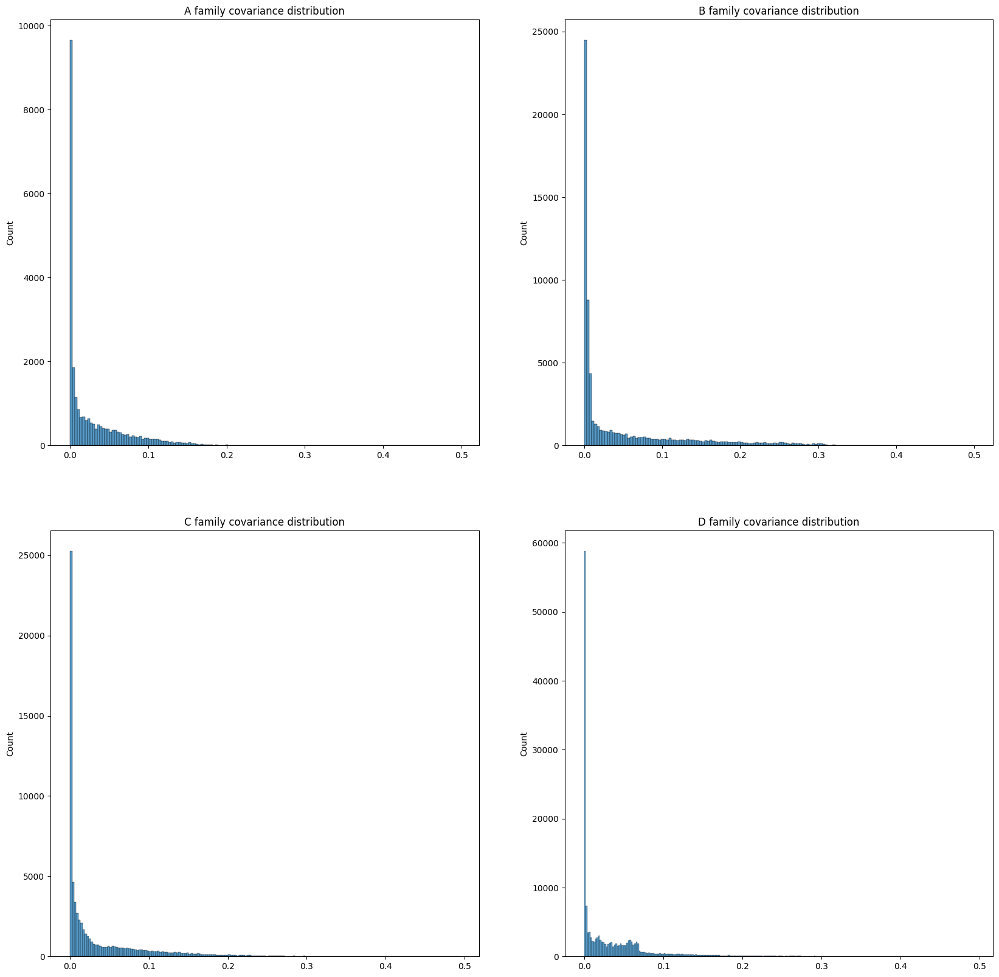

In [164]:
fig,axes = plt.subplots(2,2, figsize=(20,20))
for (i,data_set), name, ax in zip(enumerate(data_sets), data_sets_name,axes.flatten()):
    seqs  = read_fasta(data_set)
    one_hot = one_hot_tranform(seqs,lett2index=lett2index,N_aa=5)
    cov = calc_cov_mat(one_hot,N_aa=5)
    cov_Fro = np.linalg.norm(cov, ord='fro', axis=(1,2))
    sns.histplot(cov_Fro.flatten(), ax=ax)
    ax.set_title(f'{name} family covariance distribution')

In [3]:
## Part II: Concatenation based on the species

import pandas as pd
from Bio import SeqIO

def fasta_to_dataframe(fasta_file,family_name='A'):
    records = list(SeqIO.parse(fasta_file, "fasta"))
    data = {f"Description_{family_name}": [record.description for record in records],
            f"Sequence_{family_name}": [str(record.seq) for record in records]}
    df = pd.DataFrame(data)
    return df

In [4]:
df_A = fasta_to_dataframe('A_filtered.fasta')
df_A

,Description_A,Sequence_A
0,"Prot: A, level_taxid: 1236, organism taxid: ""1...",ALTYTQYSHSPNG------NKGWVLHFH-VPIAPAYVTGQPEVLIT...
1,"Prot: A, level_taxid: 1236, organism taxid: ""1...",KTVFTQYSYSPNE------NKVWVLKFRDTPIKPGYVDGIVNVLVT...
2,"Prot: A, level_taxid: 1236, organism taxid: ""9...",KVVFTQYSYSPSE------NKVWVLKYRSTPIKPGFVDGIANVLVT...
3,"Prot: A, level_taxid: 1236, organism taxid: ""1...",TRQWYSVTFSGKD----GKM-EYLAHLDVFFTKPLVTDVDGSFDIE...
4,"Prot: A, level_taxid: 1236, organism taxid: ""6...",RRNFLRTVFKSHQ----VVDKDW-DWE-KADFPPFYVNGEYPDRIF...
...,...,...
3099,"Prot: A, level_taxid: 1236, organism taxid: ""1...",RRELTLFRFAHSHRDDAYHAEDAITEWDARDFRPFFAD--VDADIE...
3100,"Prot: A, level_taxid: 1236, organism taxid: ""1...",RRELTLFRFAHSHRDDARHAEDALTEWDARDYRPFFAD--VDADIE...
3101,"Prot: A, level_taxid: 1236, organism taxid: ""4...",RRILTVFSYDFLHKEDKLKKERAVEQWEEEVLAPFFAD--IHAHVI...
3102,"Prot: A, level_taxid: 1236, organism taxid: ""2...",QRVFESITFSYAHDEDPEHRENRIRSWGAWNIDPFSVD--IVAEIQ...


In [5]:
import re
org_id_pattern = r"organism\s+taxid:\s*\"(\d+(?:_\d+)?)\""
df_A['organism_taxid'] = df_A['Description_A'].str.extract(org_id_pattern, flags=re.IGNORECASE)

In [6]:
df_A

,Description_A,Sequence_A,organism_taxid
0,"Prot: A, level_taxid: 1236, organism taxid: ""1...",ALTYTQYSHSPNG------NKGWVLHFH-VPIAPAYVTGQPEVLIT...,1513468_0
1,"Prot: A, level_taxid: 1236, organism taxid: ""1...",KTVFTQYSYSPNE------NKVWVLKFRDTPIKPGYVDGIVNVLVT...,1513468_0
2,"Prot: A, level_taxid: 1236, organism taxid: ""9...",KVVFTQYSYSPSE------NKVWVLKYRSTPIKPGFVDGIANVLVT...,932213_0
3,"Prot: A, level_taxid: 1236, organism taxid: ""1...",TRQWYSVTFSGKD----GKM-EYLAHLDVFFTKPLVTDVDGSFDIE...,1736226_0
4,"Prot: A, level_taxid: 1236, organism taxid: ""6...",RRNFLRTVFKSHQ----VVDKDW-DWE-KADFPPFYVNGEYPDRIF...,675524_0
...,...,...,...
3099,"Prot: A, level_taxid: 1236, organism taxid: ""1...",RRELTLFRFAHSHRDDAYHAEDAITEWDARDFRPFFAD--VDADIE...,163359_0
3100,"Prot: A, level_taxid: 1236, organism taxid: ""1...",RRELTLFRFAHSHRDDARHAEDALTEWDARDYRPFFAD--VDADIE...,1281578_0
3101,"Prot: A, level_taxid: 1236, organism taxid: ""4...",RRILTVFSYDFLHKEDKLKKERAVEQWEEEVLAPFFAD--IHAHVI...,437022_0
3102,"Prot: A, level_taxid: 1236, organism taxid: ""2...",QRVFESITFSYAHDEDPEHRENRIRSWGAWNIDPFSVD--IVAEIQ...,2315472_2


In [7]:
df_A['organism_taxid'].value_counts()

organism_taxid
2027290_0     4
1513468_0     3
2589817_0     3
208224_0      3
2041079_0     3
             ..
1736576_0     1
1896164_0     1
743721_0      1
314722_0      1
2315472_24    1
Name: count, Length: 3022, dtype: int64

In [8]:
df_A['gapped_freq'] = df_A.apply(lambda x: x['Sequence_A'].count('-')/len(x['Sequence_A']), axis=1)

In [9]:
df_A

,Description_A,Sequence_A,organism_taxid,gapped_freq
0,"Prot: A, level_taxid: 1236, organism taxid: ""1...",ALTYTQYSHSPNG------NKGWVLHFH-VPIAPAYVTGQPEVLIT...,1513468_0,0.099379
1,"Prot: A, level_taxid: 1236, organism taxid: ""1...",KTVFTQYSYSPNE------NKVWVLKFRDTPIKPGYVDGIVNVLVT...,1513468_0,0.099379
2,"Prot: A, level_taxid: 1236, organism taxid: ""9...",KVVFTQYSYSPSE------NKVWVLKYRSTPIKPGFVDGIANVLVT...,932213_0,0.099379
3,"Prot: A, level_taxid: 1236, organism taxid: ""1...",TRQWYSVTFSGKD----GKM-EYLAHLDVFFTKPLVTDVDGSFDIE...,1736226_0,0.086957
4,"Prot: A, level_taxid: 1236, organism taxid: ""6...",RRNFLRTVFKSHQ----VVDKDW-DWE-KADFPPFYVNGEYPDRIF...,675524_0,0.062112
...,...,...,...,...
3099,"Prot: A, level_taxid: 1236, organism taxid: ""1...",RRELTLFRFAHSHRDDAYHAEDAITEWDARDFRPFFAD--VDADIE...,163359_0,0.049689
3100,"Prot: A, level_taxid: 1236, organism taxid: ""1...",RRELTLFRFAHSHRDDARHAEDALTEWDARDYRPFFAD--VDADIE...,1281578_0,0.049689
3101,"Prot: A, level_taxid: 1236, organism taxid: ""4...",RRILTVFSYDFLHKEDKLKKERAVEQWEEEVLAPFFAD--IHAHVI...,437022_0,0.031056
3102,"Prot: A, level_taxid: 1236, organism taxid: ""2...",QRVFESITFSYAHDEDPEHRENRIRSWGAWNIDPFSVD--IVAEIQ...,2315472_2,0.018634


In [10]:
df_A_sorted = df_A.sort_values(by='gapped_freq', ascending=True)
df_A_unique = df_A_sorted.drop_duplicates(subset='organism_taxid', keep='first')
df_A_unique.reset_index(inplace=True,drop=True)
df_A_unique

,Description_A,Sequence_A,organism_taxid,gapped_freq
0,"Prot: A, level_taxid: 1236, organism taxid: ""2...",ARRYDVFDFAFAHREDAAHHERAVEVWLAPDVPPFHTDAPVTTQVW...,216778_1,0.000000
1,"Prot: A, level_taxid: 1236, organism taxid: ""8...",LRLYDLFEFAFENREDAAHAERAVVRWEAADFRPFFADAEVETDVR...,84531_0,0.000000
2,"Prot: A, level_taxid: 1236, organism taxid: ""6...",LRVYDVYEFDFENREDARHSERATERWEASDFRPFFADAEVVTDVR...,69_1,0.000000
3,"Prot: A, level_taxid: 1236, organism taxid: ""6...",LRVYDVYEFDFENREDARHRERATERWEAPDLRPFFADAAVETDVR...,69_0,0.000000
4,"Prot: A, level_taxid: 1236, organism taxid: ""7...",RRRYDVFDFAFAHRADAPHRERAVPEWEAADIAPFFADAEVEAAVH...,701189_0,0.000000
...,...,...,...,...
3017,"Prot: A, level_taxid: 1236, organism taxid: ""2...",IRRYTIFSYDYPNKE--THPEHQSQKWVTKDLPPFSADG-VETDIK...,2340_0,0.124224
3018,"Prot: A, level_taxid: 1236, organism taxid: ""1...",RRVLNVFAYDYANKE--SHNQRAVEQWEQWDIEPFRVDG-VDADVL...,1818881_0,0.124224
3019,"Prot: A, level_taxid: 1236, organism taxid: ""2...",NEQYDKENFIFKKCEANVLDVETLI-----------------LDTL...,2028576_0,0.136646
3020,"Prot: A, level_taxid: 1236, organism taxid: ""9...",DEFYRSPFRTLIGE---RKRVYTLM-----------------IEDV...,990268_2,0.273292


In [11]:
protein_families = ['A','B','C','D']
dfs = []
for fa in protein_families:
    df = fasta_to_dataframe(f"{fa}_filtered.fasta",family_name=fa)
    df['organism_tax_id'] = df[f'Description_{fa}'].str.extract(org_id_pattern, flags=re.IGNORECASE)
    df['gapped_freq'] = df.apply(lambda x: x[f'Sequence_{fa}'].count('-')/len(x[f'Sequence_{fa}']), axis=1)
    df_sorted = df.sort_values(by='gapped_freq', ascending=True)
    df_unique = df_sorted.drop_duplicates(subset='organism_tax_id', keep='first')
    df_unique.reset_index(inplace=True,drop=True)
    dfs.append(df_unique[['organism_tax_id',f'Sequence_{fa}']])

In [12]:
dfs[1]

,organism_tax_id,Sequence_B
0,1849383_0,VAVKAKIAPHSEYGEVSIDDFSFAFIDKIDPNLTLTPLEYLSRTLQ...
1,40215_0,VAVPAKIAPHSEYGVIEIDEFKFDFIDKVDPNLKLQCLPLPERTLQ...
2,1144668_0,VAVPAKIAPHSEYGVIEIDEFKFDFIDKIDPNLKLQCLSLPERTLQ...
3,2483802_0,VAVPAKIAPHSQYDVIEIDEFKFDFIDDIEPNLKLQCLPLPERTLQ...
4,1661746_0,VAVPAKIAPHSQYDVIEIDEFKFDFLDTIEPNLKLQCLPLPERTLQ...
...,...,...
3003,1904462_0,-------------------DFQFGFLDTVDPNLWLKPLARPQRTLQ...
3004,419257_0,----------------------------------------------...
3005,2056850_0,IAVPAKIGPHPDYGLIEFDEFRYDFLSDPKRKIALQPLSRPERSLQ...
3006,242606_1,VAVPAKIAPYPDYDVIAVDEFRFDFISKVEPNLSLRPLPRPERLLQ...


In [13]:
from functools import reduce
df = reduce(lambda x, y: pd.merge(x, y, on='organism_tax_id', how='inner'), dfs)
df['Sequence'] = df.apply(lambda x: ''.join([x[f'Sequence_{fa}'] for fa in protein_families]), axis=1)


{'A': 1, 'C': 2, 'D': 3, 'E': 4, 'F': 5, 'G': 6, 'H': 7, 'I': 8, 'K': 9, 'L': 10, 'M': 11, 'N': 12, 'P': 13, 'Q': 14, 'R': 15, 'S': 16, 'T': 17, 'V': 18, 'W': 19, 'Y': 20, '-': 21}


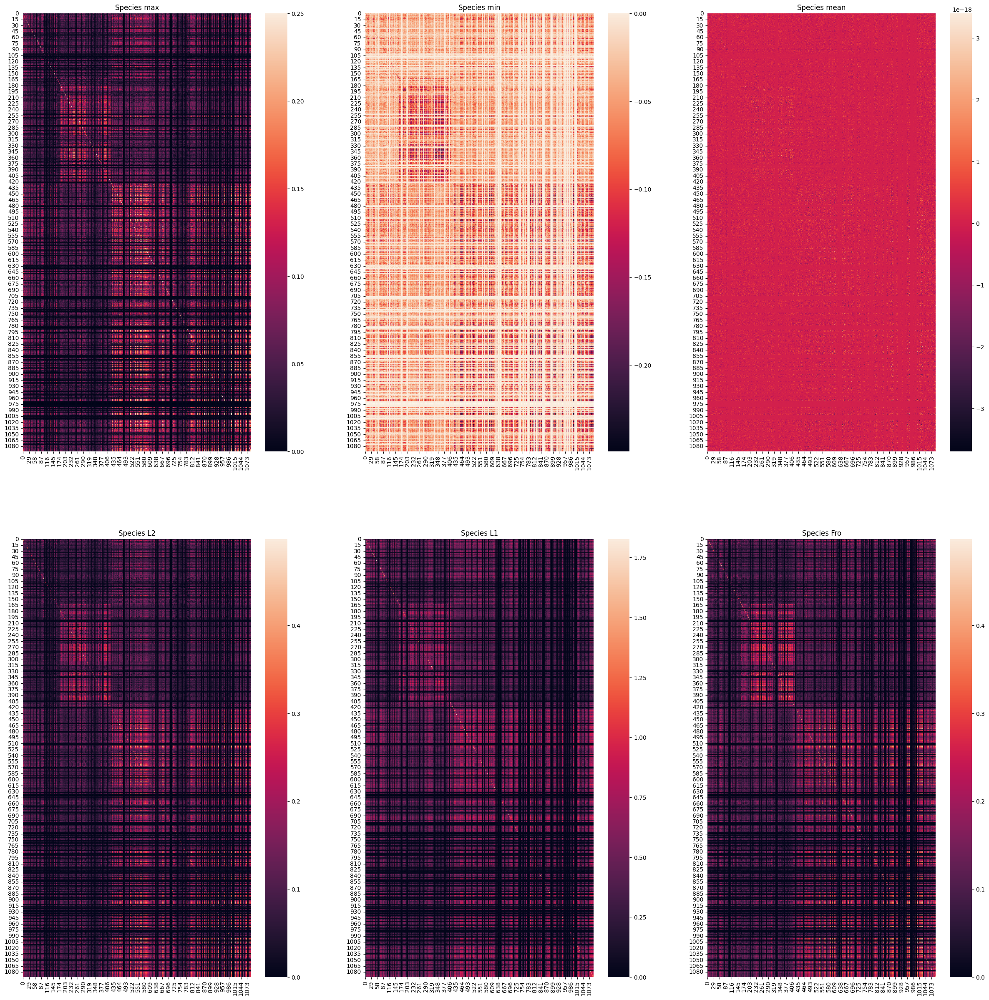

In [151]:
methods = ['max', 'min', 'mean', 'L2', 'L1',"Fro"]
fig,axes = plt.subplots(2,3, figsize=(30,30))

seqs = df['Sequence'].to_list()
one_hot = one_hot_tranform(seqs)
cov = calc_cov_mat(one_hot)
    
for method, ax in zip(methods, axes.flatten()):
    if method == 'max':
        cov_max = cov.max(axis=(1,2))
        sns.heatmap(cov_max, ax=ax)
    elif method == 'min':
        cov_min = cov.min(axis=(1,2))
        sns.heatmap(cov_min, ax=ax)
    elif method == 'mean':
        cov_mean = cov.mean(axis=(1,2))
        sns.heatmap(cov_mean, ax=ax)
    elif method == 'L2':
        cov_L2 = np.linalg.norm(cov, ord=2, axis=(1,2))
        sns.heatmap(cov_L2, ax=ax)
    elif method == 'L1':
        cov_L1 = np.sum(np.abs(cov), axis=(1,2))
        sns.heatmap(cov_L1, ax=ax)
    elif method == 'Fro':
        cov_Fro = np.linalg.norm(cov, ord='fro', axis=(1,2))
        sns.heatmap(cov_Fro, ax=ax)
    ax.set_title(f'Species {method}')



In [14]:
df.iloc[0].apply(len)

organism_tax_id       8
Sequence_A          161
Sequence_B          264
Sequence_C          267
Sequence_D          401
Sequence           1093
Name: 0, dtype: int64

Text(0.5, 1.0, 'Family covariance distribution')

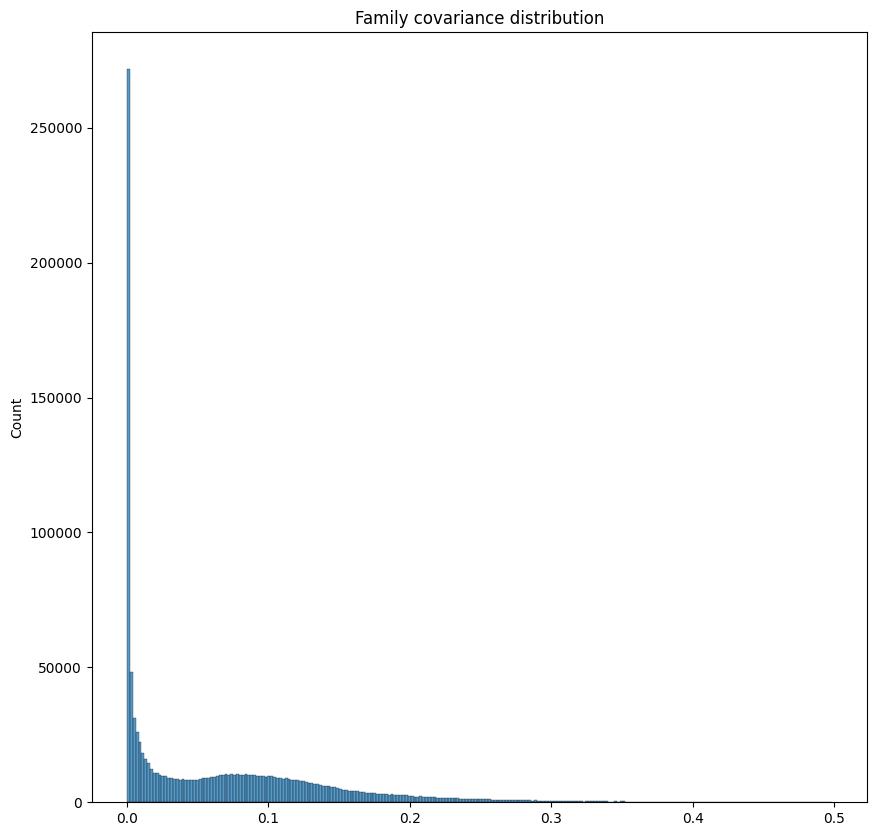

In [17]:
fig,ax = plt.subplots(1,1, figsize=(10,10))
seqs = df['Sequence'].to_list()
one_hot = one_hot_tranform(seqs)
cov = calc_cov_mat(one_hot)
cov_Fro = np.linalg.norm(cov, ord='fro', axis=(1,2))
sns.histplot(cov_Fro.flatten(),ax=ax)
ax.set_title(f'Family covariance distribution')
